In [1]:
import pandas as pd
import os
import cv2
import numpy as np
from sklearn.utils import shuffle
from sklearn.cross_validation import train_test_split
import matplotlib.pyplot as plt
np.set_printoptions(threshold='nan')
from nolearn.lasagne import BatchIterator
from lasagne import layers, nonlinearities
# from lasagne.updates import nesterov_momentum
from nolearn.lasagne import NeuralNet
import theano

Using gpu device 0: GeForce GT 635M


### Carga de las imagenes y landmarks a probar

In [2]:
from sklearn import preprocessing
from sklearn import decomposition

def load(test=False, cols=None):
    """Loads data from FTEST if *test* is True, otherwise from FTRAIN.
    Pass a list of *cols* if you're only interested in a subset of the
    target columns.
    """
    fname = 'lateral/96x96_no_index_all.csv'
    df = pd.read_csv(fname)  # load pandas dataframe

    # The Image column has pixel values separated by space; convert
    # the values to numpy arrays:
    df['Image'] = df['Image'].apply(lambda im: np.fromstring(im, sep=' '))

    if cols:  # get a subset of columns
        df = df[list(cols) + ['Image']]

    #print(df.count())  # prints the number of values for each column
    df = df.dropna()  # drop all rows that have missing values in them
    X = np.vstack(df['Image'].values) / 255.  # scale pixel values to [0, 1]
    #pca_white = decomposition.RandomizedPCA() #(whiten=True)
    #X = pca_white.fit_transform(X)
    #print pca_white.explained_variance_ratio_
    
    X = X.astype(np.float32)

    y = df[df.columns[:-1]].values
    y = (y - 48) / 48  # scale target coordinates to [-1, 1]
    #minmax = preprocessing.MinMaxScaler(feature_range=(-1, 1), copy=True)
    #y = minmax.fit_transform(y)
    X, y = shuffle(X, y, random_state=42)  # shuffle train data
    y = y.astype(np.float32)


    return X, y


X, y = load()
print X.shape
X = X.reshape(-1, 1, 96, 96)
#print("X.shape == {}; X.min == {:.3f}; X.mravelax == {:.3f}".format(
#    X.shape, X.min(), X.max()))
#print("y.shape == {}; y.min == {:.3f}; y.max == {:.3f}".format(
#    y_train.shape, y_train.min(), y_train.max()))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train.shape, y_test.shape


(2073, 9216)


((1658, 1, 96, 96), (415, 82))

### O solamente cargar imagenes para landmarkear

In [2]:
def load_images(filename='mexico_photos.csv'):
    df = pd.read_csv(filename)
    # The Image column has pixel values separated by space; convert
    # the values to numpy arrays:
    df['Image'] = df['Image'].apply(lambda im: np.fromstring(im, sep=' '))

    x = np.vstack(df['Image'].values) / 255.  # scale pixel values to [0, 1]
    x = x.astype(np.float32)
    return x, df.ix[:, 0]

### Graficar los landmarks sobre imagenes

In [3]:
%matplotlib inline
def plot_sample(img, y, axis, move=48):
    axis.imshow(img, cmap='gray')
    #axis.scatter(y[0::2], y[1::2], marker='x', s=5)

    axis.scatter(y[0::2] * move + move, y[1::2] * move + move, marker='x', s=5)

In [ ]:
angle = 65.
theta = angle * np.pi/180.

rotMatrix = np.array([[np.cos(theta), -np.sin(theta)], 
                         [np.sin(theta), np.cos(theta)]])

#xr = (x - xm) * cos(a) - (y - ym) * sin(a)   + xm,
#yr = (x - xm) * sin(a) + (y - ym) * cos(a)   + ym;

In [ ]:
from scipy import ndimage

for i in range(5):
    plt.clf()
    fig = plt.figure(figsize=(6, 3))
    ax = fig.add_subplot(1, 2, 1, xticks=[], yticks=[])
    img = X_train[i].reshape(96, 96)
    #y = minmax.inverse_transform()
    plot_sample(img, y_train[i], ax)
    #print y.shape
    ax = fig.add_subplot(1, 2, 2, xticks=[], yticks=[])
    # flipped = img[:, ::-1]
    flipped = ndimage.rotate(img, -65., reshape=False)
    print flipped.shape, img.shape
    y_flipped = np.copy(y_train[i])

    # y_flipped[::2] = y_flipped[::2] * -1
    c = []
    y_flipped = y_flipped.reshape((41, 2))
    for i in range(y_flipped.shape[0]):
        c.append(np.dot(rotMatrix, y_flipped[i]))
    c = np.array(c).reshape((82,))
    plot_sample(flipped, c, ax, move=48)
    plt.show()
    plt.savefig('/tmp/lateral_{}.png'.format(str(i)))

### Crear las clases necesarias para levantar la CNN

In [5]:
from nolearn.lasagne import BatchIterator
from random import randint
class FlipBatchIterator(BatchIterator):

    def transform(self, Xb, yb):
        Xb, yb = super(FlipBatchIterator, self).transform(Xb, yb)

        # Flip half of the images in this batch at random:
        bs = Xb.shape[0]
        indices = np.random.choice(bs, bs/2, replace=False) # /2 choose all
        Xb[indices] = Xb[indices, :, :, ::-1]

        if yb is not None:
            # Horizontal flip of all x coordinates:
            yb[indices, ::2] = yb[indices, ::2] * -1

        return Xb, yb

"""if choice([0, 0, 0, 0, 0, 0, 0, 1]) == 0:
Xb[indices] = Xb[indices, :, :, ::-1]

if yb is not None:
    # Horizontal flip of all x coordinates:
    yb[indices, ::2] = yb[indices, ::2] * -1
#else:
#    for ind in indices:
#        Xb[ind] = ndimage.rotate(Xb[ind], -angle, reshape=False)

if yb is not None:
    # print "----->", yb.shape # (164, 82)
    for ind in indices:
        c = []
        # print yb[ind], yb[ind].shape
        temp_y = yb[ind].reshape((41, 2))
        for i in temp_y:
            c.append(np.dot(rot_matrix, i))
            # print np.array(c).shape
        yb[ind] = np.copy(np.array(c).reshape((82,)))
"""

'if choice([0, 0, 0, 0, 0, 0, 0, 1]) == 0:\nXb[indices] = Xb[indices, :, :, ::-1]\n\nif yb is not None:\n    # Horizontal flip of all x coordinates:\n    yb[indices, ::2] = yb[indices, ::2] * -1\n#else:\n#    for ind in indices:\n#        Xb[ind] = ndimage.rotate(Xb[ind], -angle, reshape=False)\n\nif yb is not None:\n    # print "----->", yb.shape # (164, 82)\n    for ind in indices:\n        c = []\n        # print yb[ind], yb[ind].shape\n        temp_y = yb[ind].reshape((41, 2))\n        for i in temp_y:\n            c.append(np.dot(rot_matrix, i))\n            # print np.array(c).shape\n        yb[ind] = np.copy(np.array(c).reshape((82,)))\n'

In [6]:
class AdjustVariable(object):
    def __init__(self, name, start=0.03, stop=0.001):
        self.name = name
        self.start, self.stop = start, stop
        self.ls = None

    def __call__(self, nn, train_history):
        if self.ls is None:
            self.ls = np.linspace(self.start, self.stop, nn.max_epochs)

        epoch = train_history[-1]['epoch']
        new_value = np.float32(self.ls[epoch - 1])
        getattr(nn, self.name).set_value(new_value)

In [7]:
import sys
sys.setrecursionlimit(100000)

import cPickle as pickle
net0 = None
with open('edp/small_learn_rate_03_15x15.pickle', 'rb') as f:
    net0 = pickle.load(f)

net1 = None
with open('edp/small_learn_rate_06_8x8_pretrained.pickle', 'rb') as f:
    net1 = pickle.load(f)

net2 = None    
with open('edp/small_learn_rate_03_8x8.pickle', 'rb') as f:
    net2 = pickle.load(f)

  input             	(None, 1, 96, 96)   	produces    9216 outputs
  conv1             	(None, 32, 82, 82)  	produces  215168 outputs
  pool1             	(None, 32, 41, 41)  	produces   53792 outputs
  dropout1          	(None, 32, 41, 41)  	produces   53792 outputs
  conv2             	(None, 64, 28, 28)  	produces   50176 outputs
  pool2             	(None, 64, 14, 14)  	produces   12544 outputs
  dropout2          	(None, 64, 14, 14)  	produces   12544 outputs
  conv3             	(None, 148, 1, 1)   	produces     148 outputs
  pool3             	(None, 148, 1, 1)   	produces     148 outputs
  dropout3          	(None, 148, 1, 1)   	produces     148 outputs
  hidden5           	(None, 1000)        	produces    1000 outputs
  dropout5          	(None, 1000)        	produces    1000 outputs
  hidden6           	(None, 1000)        	produces    1000 outputs
  output            	(None, 82)          	produces      82 outputs
  input             	(None, 1, 96, 96)   	produces    9216 out

### Herramientas para visualizar resultados

In [ ]:
import theano
from theano import tensor as T
from theano.tensor.nnet import conv


In [ ]:
%matplotlib inline
img_ = X_train[0].transpose(2, 0, 1).reshape(1, 1, 96, 96)
layers = net0.layers_['conv1']
output = layers.get_output_for(img_)
type(output)
input = T.tensor4(name='input')
f = theano.function([input], output, on_unused_input='warn')
filtered = f(img_)
plt.gray()
plt.imshow(filtered[0, 0, :, :])
plt.show()

In [ ]:
print net1.conv1_filter_size
print net2.conv1_filter_size

In [ ]:
%matplotlib inline
from matplotlib import pyplot
import matplotlib.pyplot as plt


plt.clf()
plt.figure(figsize=(20,10))
train_loss = np.array([i["train_loss"] for i in net1.train_history_])
valid_loss = np.array([i["valid_loss"] for i in net1.train_history_])
pyplot.plot(train_loss[:5000], '--b', linewidth=2, label="net1 train")
pyplot.plot(valid_loss[:5000], '-b', linewidth=2, label="net1 valid")

train_loss = np.array([i["train_loss"] for i in net0.train_history_])
valid_loss = np.array([i["valid_loss"] for i in net0.train_history_])
pyplot.plot(train_loss[:5000], '--g', linewidth=2, label="net0 train")
pyplot.plot(valid_loss[:5000], '-g', linewidth=2, label="net0 valid")

train_loss = np.array([i["train_loss"] for i in net2.train_history_])
valid_loss = np.array([i["valid_loss"] for i in net2.train_history_])
pyplot.plot(train_loss[:5000], '--r', linewidth=2, label="net2 train")
pyplot.plot(valid_loss[:5000], '-r', linewidth=2, label="net2 valid")
#print train_loss[8000:8500]
pyplot.grid()
pyplot.legend()
pyplot.xlabel("epoch")
pyplot.ylabel("loss")
pyplot.ylim(1e-4, 1e-1)
pyplot.yscale("log")
pyplot.show()

In [9]:
print net0.score(X_test, y_test)
print net1.score(X_test, y_test)
print net2.score(X_test, y_test)

0.00127397698816
0.000663383165374
0.000830304634292


In [11]:
y_pred = net1.predict(X_test)
from sklearn.metrics import mean_squared_error,  mean_absolute_error, explained_variance_score, r2_score
print np.sqrt(mean_squared_error(y_test, y_pred))*48
print explained_variance_score(y_test.ravel(), y_pred.ravel())
print mean_absolute_error(y_test, y_pred)
print r2_score(y_test, y_pred) 

1.23629879951
0.995445319451
0.0188005
0.93944978753


1658


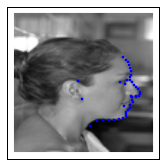

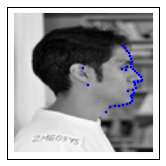

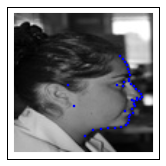

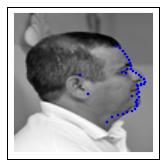

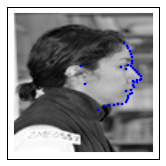

...

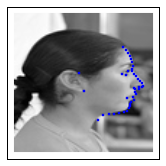

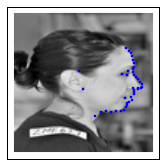

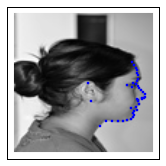

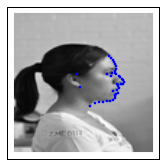

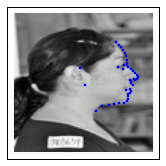

In [15]:
print X_train.shape[0]
for i in range(X_test.shape[0]):
    plt.clf()
    fig = plt.figure(figsize=(6, 3))
    ax = fig.add_subplot(1, 2, 1, xticks=[], yticks=[])
    img = X_test[i].reshape(96, 96)
    plot_sample(img, y_pred[i], ax)
    #ax = fig.add_subplot(1, 2, 2, xticks=[], yticks=[])
    #flipped = np.fliplr(img)
    #y_flipped = np.copy(y_pred[i])
    #y_flipped[::2] = y_flipped[::2]*-1
    #plot_sample(flipped, y_flipped, ax)
    plt.show()
    plt.savefig('/tmp/out_lateral_{}.png'.format(str(i)))

0.313535 0.313818 0.381616 0.380589


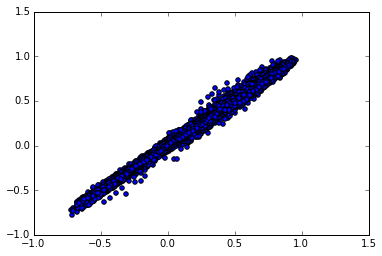

(0.99772006, 0.0)

In [16]:
from sklearn.metrics import confusion_matrix, classification_report
from scipy.stats import pearsonr
print y_test.mean(), y_pred.mean(), y_test.std(), y_pred.std()
plt.clf()
plt.scatter(y_pred, y_test)
plt.show()
plt.savefig('/tmp/chan_chan.png')
pearsonr(y_pred.ravel(), y_test.ravel())

### Automatic landmarking

In [23]:
df = pd.DataFrame(index=country_ids.values, columns=range(82))
#df = predicted[0]
for pred in range(predicted[0].shape[0]):
    #print country_ids.values[pred]
    df.loc[country_ids[pred]] = predicted[0][pred]

In [24]:
df.to_csv('/tmp/colombia_lateral_landmarking_raw.txt')

In [42]:
class Shape(object):
        def __init__(self, landmarks, name):
            self.xy = np.array(landmarks, dtype=np.float)
            self.nr_landmarks =  self.xy.shape[0]/2
            self.name = name
            self.centroid = self.get_centroid()

        def load_shape(self, shape):
            pass

        def translate_shape(self, direction):

            T = np.identity(3)
            T[:2, 2] = direction[:2]

            return T

        def get_centroid(self):
            centroid = self.xy.mean(0)
            return centroid

        def align_shape(self, mean_shape):
            """
            Procrustes fit
            """
            n, m = mean_shape.xy.shape
            ny, my = self.xy.shape
            reflection = 'best'
            scaling = True

            X0 = mean_shape.xy - mean_shape.centroid
            Y0 = self.xy - self.centroid

            ssX = (X0**2.).sum()
            ssY = (Y0**2.).sum()
            
            # centred Frobenius norm
            normX = np.sqrt(ssX)
            normY = np.sqrt(ssY)

            # scale to equal (unit) norm
            X0 /= normX
            Y0 /= normY

            if my < m:
                Y0 = np.concatenate((Y0, np.zeros(n, m-my)),0)
            # optimum rotation matrix of Y
            A = np.dot(X0.T, Y0)
            U,s,Vt = np.linalg.svd(A,full_matrices=False)
            V = Vt.T
            T = np.dot(V, U.T)

            if reflection is not 'best':

                # does the current solution use a reflection?
                have_reflection = np.linalg.det(T) < 0
                # if that's not what was specified, force another reflection
                if reflection != have_reflection:
                    V[:,-1] *= -1
                    s[-1] *= -1
                    T = np.dot(V, U.T)

            traceTA = s.sum()

            if scaling:

                # optimum scaling of Y
                b = traceTA * normX / normY

                # standarised distance between X and b*Y*T + c
                d = 1 - traceTA**2

                # transformed coords
                Z = normX*traceTA*np.dot(Y0, T) + mean_shape.centroid

            else:
                b = 1
                d = 1 + ssY/ssX - 2 * traceTA * normY / normX
                Z = normY*np.dot(Y0, T) + mean_shape.centroid

            # transformation matrix
            if my < m:
                T = T[:my,:]
            c = mean_shape.centroid - b*np.dot(self.centroid, T)

            #transformation values 
            tform = {'rotation':T, 'scale':b, 'translation':c}

            self.xy = Z.copy()
            #print d

        def plot_shape(self):
            return plt.plot(self.xy[:,0], self.xy[:,1], 'o')

(1643, 82)


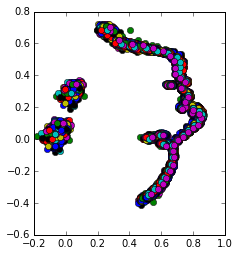

In [45]:
my_shapes = []
print predicted[0].shape
for i in predicted[0]:
    p = i.reshape((41,2))
    my_shapes.append(Shape(p, "lero"))
for shape in my_shapes:
    shape.align_shape(my_shapes[0])
for shape in my_shapes:
    shape.plot_shape()

plt.axes().set_aspect('equal')
plt.show()

### move back to normal coordinates (not necessary)

In [ ]:
def back_roi_coordinates(coordinates, rect, dx=33.5, dy=22.25):
    """
    Translate the general coordinates to the ROI rect and scaled
    """
    return map(lambda c: [coordinates[c] * dx, 96 + coordinates[c + 1] * dy], 
               range(0, len(coordinates), 2))

    #return map(lambda c: [coordinates[c]/dx, 145 - coordinates[c + 1]/dy], 
    #           range(0, len(coordinates), 2))

def draw_landmarks(image, coordinates):
    """
    Draw the landmarks in the image
    """
    for coord in coordinates: #2D coordinates
        cv2.circle(image, (int(coord[0]), int(coord[1])), 2, (200, 200, 200), -1)

    return image

In [ ]:
imagenes_dif_size = ['ZCH' + str(i) for i in range(1020, 1560)]
imagenes_dif_size.append('ZME0738')

In [ ]:
df_out = pd.DataFrame(index=ids, columns=range(82))
for image_id in ids:
    #image_filename = [filename for filename in os.listdir(path_images) if filename.startswith(image_id)]
    my_fix_size = map(lambda i: image_id.startswith(i),imagenes_dif_size)
    if True in my_fix_size:# or image_filename[0].startswith(a):
        print 'yupi'
        dx=29.6666666667
        dy=44.666666666666664
    else:
        dx=22.25
        dy=33.5
    coords = np.array(back_roi_coordinates(df.loc[image_id].values, [0, 0, 96, 96], dx, dy))
    #ima = draw_landmarks(image, coords)
    #cv2.imwrite('/tmp/demo_{}.jpg'.format(image_id), ima)
    for i,z in zip(headers_xy, coords.flatten()):
        df_out[i][image_id] = z